In [1]:
# Cell 0 — Environment setup and dataset path detection
import os
import pandas as pd
from pathlib import Path

IS_KAGGLE = os.path.exists("/kaggle/input")

if IS_KAGGLE:
    input_root = Path("/kaggle/input")

    # Find folder containing train/, test/, and submission.csv
    data_dir = None
    for check_dir in [input_root] + [d for d in input_root.rglob("*") if d.is_dir()]:
        if (
            (check_dir / "train").exists()
            and (check_dir / "test").exists()
            and (check_dir / "submission.csv").exists()
        ):
            data_dir = check_dir
            break

    if data_dir is None:
        raise FileNotFoundError(
            "No folder found containing train/, test/, and submission.csv "
            "under /kaggle/input/."
        )

    output_dir = Path("/kaggle/working")

else:
    # Local: search for folder with 'satria-data-bdc' in name
    current_dir = Path.cwd()
    data_dir = None
    check_dir = current_dir
    while check_dir != check_dir.parent:
        if "satria-data-bdc" in check_dir.name.lower():
            data_dir = check_dir
            break
        check_dir = check_dir.parent
    if data_dir is None:
        data_dir = current_dir
    output_dir = data_dir

train_dir       = data_dir / "train"
test_dir        = data_dir / "test"
submission_path = data_dir / "submission.csv"

assert train_dir.exists(),       f"train_dir not found: {train_dir}"
assert test_dir.exists(),        f"test_dir not found: {test_dir}"
assert submission_path.exists(), f"submission.csv not found: {submission_path}"

print(f"Environment : {'Kaggle' if IS_KAGGLE else 'Local'}")
print(f"data_dir    : {data_dir}")
print(f"train_dir   : {train_dir}  ({len(list(train_dir.glob('*/*')))} files)")
print(f"test_dir    : {test_dir}  ({len(list(test_dir.glob('*')))} files)")
print(f"submission  : {submission_path}  ({submission_path.stat().st_size:,} bytes)")
print(f"output_dir  : {output_dir}")

Environment : Kaggle
data_dir    : /kaggle/input/datasets/ababilkhoerulimam/bdc-satria-data-2026/BDC2026
train_dir   : /kaggle/input/datasets/ababilkhoerulimam/bdc-satria-data-2026/BDC2026/train  (26527 files)
test_dir    : /kaggle/input/datasets/ababilkhoerulimam/bdc-satria-data-2026/BDC2026/test  (1458 files)
submission  : /kaggle/input/datasets/ababilkhoerulimam/bdc-satria-data-2026/BDC2026/submission.csv  (7,654 bytes)
output_dir  : /kaggle/working


In [2]:
# Cell 0b — Generate duplicate and train-test overlap CSVs
import re
import hashlib
from collections import defaultdict

def compute_file_hash(file_path, chunk_size=8192):
    hasher = hashlib.md5()
    with open(file_path, "rb") as f:
        while chunk := f.read(chunk_size):
            hasher.update(chunk)
    return hasher.hexdigest()

def hash_all(root_dirs):
    hash_map  = defaultdict(list)
    all_files = []
    exts      = {".jpg", ".jpeg", ".png"}
    for label, folder in root_dirs.items():
        folder = Path(folder)
        for fp in folder.rglob("*"):
            if fp.is_file() and fp.suffix.lower() in exts:
                h = compute_file_hash(fp)
                hash_map[h].append((label, str(fp)))
                all_files.append((label, fp))
    return hash_map, all_files

train_dirs = {
    "0_Recyclable": train_dir / "0_Recyclable",
    "1_Electronic": train_dir / "1_Electronic",
    "2_Organic":    train_dir / "2_Organic",
}
test_dir_map = {"test": test_dir}

print("Hashing train files...")
train_hashes, train_files = hash_all(train_dirs)
print("Hashing test files...")
test_hashes, _ = hash_all(test_dir_map)

# Part A: exact train-test overlap
overlap_rows = []
for h, train_entries in train_hashes.items():
    if h in test_hashes:
        for (train_label, train_path) in train_entries:
            for (_, test_path) in test_hashes[h]:
                overlap_rows.append({
                    "md5":            h,
                    "train_label":    train_label,
                    "train_path":     train_path,
                    "train_filename": Path(train_path).name,
                    "test_path":      test_path,
                    "test_id":        int(Path(test_path).stem),
                })
overlap_df = pd.DataFrame(overlap_rows)
overlap_df.to_csv(output_dir / "train_test_overlap.csv", index=False)
print(f"[A] Train-test overlap: {len(overlap_df)} rows")

# Part B: exact duplicate groups within train
group_rows = []
group_id   = 0
for h, entries in train_hashes.items():
    if len(entries) > 1:
        group_id += 1
        labels_in_group = set(label for label, _ in entries)
        is_cross_class  = len(labels_in_group) > 1
        for (label, path) in entries:
            group_rows.append({
                "md5":                  h,
                "duplicate_group_id":   group_id,
                "label":                label,
                "filepath":             path,
                "filename":             Path(path).name,
                "is_cross_class_group": is_cross_class,
                "match_type":           "exact_md5",
            })
groups_df = pd.DataFrame(group_rows)
groups_df.to_csv(output_dir / "train_duplicate_groups.csv", index=False)
print(f"[A] Exact duplicate groups: {groups_df['duplicate_group_id'].nunique()} groups")

# Part C: near-duplicate candidates via copy filename pattern e.g. "file(1).jpg"
copy_pattern = re.compile(r"^(.*)\((\d+)\)(\.\w+)$")
name_to_path = {fp.name: (label, fp) for label, fp in train_files}
candidates   = []

for label, fp in train_files:
    m = copy_pattern.match(fp.name)
    if m:
        base_name = m.group(1) + m.group(3)
        if base_name in name_to_path:
            orig_label, orig_fp = name_to_path[base_name]
            h_copy = compute_file_hash(fp)
            h_orig = compute_file_hash(orig_fp)
            candidates.append({
                "file_a":    fp.name,
                "file_b":    base_name,
                "label_a":   label,
                "label_b":   orig_label,
                "md5_match": h_copy == h_orig,
                "path_a":    str(fp),
                "path_b":    str(orig_fp),
            })

cand_df     = pd.DataFrame(candidates)
near_dup_df = cand_df[~cand_df["md5_match"]].copy()
near_dup_df.to_csv(output_dir / "near_duplicate_candidates.csv", index=False)
print(f"[C] Near-duplicate candidates: {len(near_dup_df)} pairs")

Hashing train files...
Hashing test files...
[A] Train-test overlap: 97 rows
[A] Exact duplicate groups: 62 groups
[C] Near-duplicate candidates: 2 pairs


In [3]:
# Cell 0c — Load duplicate CSVs from output_dir
overlap_df  = pd.read_csv(output_dir / "train_test_overlap.csv")
groups_df   = pd.read_csv(output_dir / "train_duplicate_groups.csv")
near_dup_df = pd.read_csv(output_dir / "near_duplicate_candidates.csv")

print(f"overlap_df  : {overlap_df.shape}")
print(f"groups_df   : {groups_df.shape}")
print(f"near_dup_df : {near_dup_df.shape}")

overlap_df  : (97, 6)
groups_df   : (124, 7)
near_dup_df : (2, 7)


In [4]:
# Cell 1 — Build train file list with labels
label_map = {"0_Recyclable": 0, "1_Electronic": 1, "2_Organic": 2}

records = []
for folder in train_dir.iterdir():
    if not folder.is_dir():
        continue
    if folder.name not in label_map:
        print(f"Warning: unexpected folder '{folder.name}' — skipped")
        continue
    label_id = label_map[folder.name]
    for fp in folder.glob("*"):
        if fp.is_file():
            records.append({
                "filename":     fp.name,
                "filepath":     str(fp),
                "label":        label_id,
                "label_folder": folder.name,
            })

train_master = pd.DataFrame(records)
print(train_master.shape)
train_master.head()

(26527, 4)


,filename,filepath,label,label_folder
0,R_6214.jpg,/kaggle/input/datasets/ababilkhoerulimam/bdc-s...,0,0_Recyclable
1,R_8141.jpg,/kaggle/input/datasets/ababilkhoerulimam/bdc-s...,0,0_Recyclable
2,R_2463.jpg,/kaggle/input/datasets/ababilkhoerulimam/bdc-s...,0,0_Recyclable
3,R_9892.jpg,/kaggle/input/datasets/ababilkhoerulimam/bdc-s...,0,0_Recyclable
4,R_5469.jpg,/kaggle/input/datasets/ababilkhoerulimam/bdc-s...,0,0_Recyclable


In [5]:
# Cell 2 — Merge exact duplicate group IDs into train_master
train_master["duplicate_group_id"] = range(len(train_master))

filename_to_group = dict(zip(groups_df["filename"], groups_df["duplicate_group_id"]))
offset = train_master["duplicate_group_id"].max() + 1
filename_to_group = {k: v + offset for k, v in filename_to_group.items()}

train_master["duplicate_group_id"] = train_master.apply(
    lambda row: filename_to_group.get(row["filename"], row["duplicate_group_id"]),
    axis=1,
)

n_files           = len(train_master)
n_exact_dup_files = groups_df["filename"].nunique()
expected_unique   = n_files - n_exact_dup_files + groups_df["duplicate_group_id"].nunique()

assert train_master["duplicate_group_id"].nunique() == expected_unique, (
    f"Group collapse mismatch: got {train_master['duplicate_group_id'].nunique()}, "
    f"expected {expected_unique}"
)
print("Unique groups after exact-dup merge:", train_master["duplicate_group_id"].nunique())

Unique groups after exact-dup merge: 26465


In [6]:
# Cell 3 — Merge near-duplicate group IDs into train_master
NEAR_DUP_GROUP_START = 900000  # well above any file-count-based ID, avoids collision

near_dup_pairs = list(near_dup_df[["file_a", "file_b"]].itertuples(index=False, name=None))

for i, (fa, fb) in enumerate(near_dup_pairs):
    group_id = NEAR_DUP_GROUP_START + i
    mask     = train_master["filename"].isin([fa, fb])
    matched  = train_master.loc[mask, "filename"].tolist()
    if len(matched) != 2:
        print(f"Warning: expected 2 matches for pair ({fa}, {fb}), found {matched}")
        continue
    train_master.loc[mask, "duplicate_group_id"] = group_id

print("Unique groups after near-dup merge:", train_master["duplicate_group_id"].nunique())

Unique groups after near-dup merge: 26463


In [7]:
# Cell 4 — Flag files excluded from CV and training
overlap_filenames = set(overlap_df["train_filename"])

# O_8873.jpg: confirmed mislabel — duplicate of R_799.jpg (cloth bag),
# true class = Recyclable, mislabeled as Organic. Excluded from training entirely.
MISLABEL_EXCLUDE = {"O_8873.jpg"}

train_master["exclude_from_cv"]       = train_master["filename"].isin(overlap_filenames)
train_master["exclude_from_training"] = train_master["filename"].isin(MISLABEL_EXCLUDE)

print("exclude_from_cv count      :", train_master["exclude_from_cv"].sum(),       "(expected 97)")
print("exclude_from_training count:", train_master["exclude_from_training"].sum(), "(expected 1)")

exclude_from_cv count      : 97 (expected 97)
exclude_from_training count: 1 (expected 1)


In [8]:
# Cell 5 — Validate train_master integrity and save CSV
assert train_master["exclude_from_cv"].sum() == 97,      "Overlap count mismatch!"
assert train_master["exclude_from_training"].sum() == 1, "Mislabel exclude mismatch!"
assert train_master["filename"].duplicated().sum() == 0, "Duplicate filenames in master list!"

# No group should span multiple classes unless explicitly flagged as cross-class
cross_class_check = train_master.groupby("duplicate_group_id")["label"].nunique()
unexpected_cross  = set(cross_class_check[cross_class_check > 1].index)
flagged_groups    = set(
    groups_df.loc[groups_df["is_cross_class_group"] == True, "duplicate_group_id"] + offset
)
assert unexpected_cross.issubset(flagged_groups), (
    f"Unexpected cross-class groups: {unexpected_cross - flagged_groups}"
)

print("Total train files:", len(train_master))
print("Files available for CV:", len(train_master[
    (~train_master["exclude_from_cv"]) & (~train_master["exclude_from_training"])
]))
print("Cross-class groups detected:", len(unexpected_cross | flagged_groups),
      "-> all expected:", unexpected_cross.issubset(flagged_groups))

train_master.to_csv(output_dir / "train_master_with_groups.csv", index=False)
train_master.head(10)

Total train files: 26527
Files available for CV: 26429
Cross-class groups detected: 1 -> all expected: True


,filename,filepath,label,label_folder,duplicate_group_id,exclude_from_cv,exclude_from_training
0,R_6214.jpg,/kaggle/input/datasets/ababilkhoerulimam/bdc-s...,0,0_Recyclable,0,False,False
1,R_8141.jpg,/kaggle/input/datasets/ababilkhoerulimam/bdc-s...,0,0_Recyclable,1,False,False
2,R_2463.jpg,/kaggle/input/datasets/ababilkhoerulimam/bdc-s...,0,0_Recyclable,2,False,False
3,R_9892.jpg,/kaggle/input/datasets/ababilkhoerulimam/bdc-s...,0,0_Recyclable,3,False,False
4,R_5469.jpg,/kaggle/input/datasets/ababilkhoerulimam/bdc-s...,0,0_Recyclable,4,False,False
5,R_6347.jpg,/kaggle/input/datasets/ababilkhoerulimam/bdc-s...,0,0_Recyclable,5,False,False
6,R_6353.jpg,/kaggle/input/datasets/ababilkhoerulimam/bdc-s...,0,0_Recyclable,6,False,False
7,R_3408.jpg,/kaggle/input/datasets/ababilkhoerulimam/bdc-s...,0,0_Recyclable,7,False,False
8,R_9369.jpg,/kaggle/input/datasets/ababilkhoerulimam/bdc-s...,0,0_Recyclable,8,False,False
9,R_7688.jpg,/kaggle/input/datasets/ababilkhoerulimam/bdc-s...,0,0_Recyclable,9,False,False


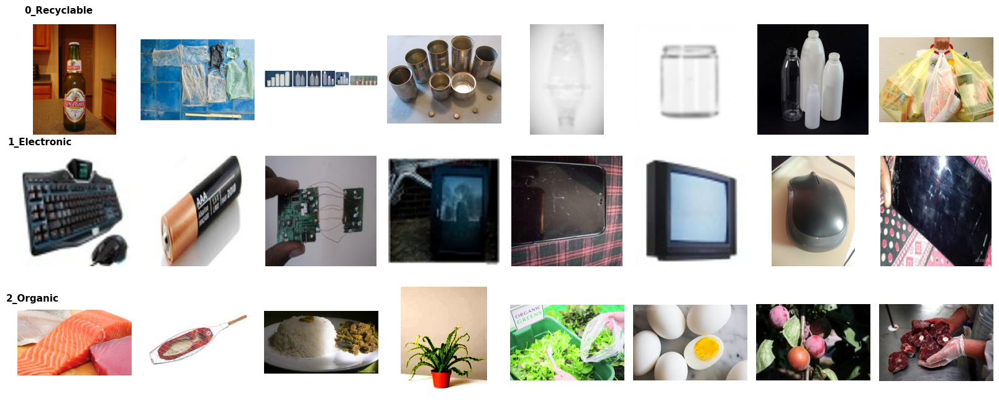

In [9]:
# Cell 6 — Visual sample grid per class
import random
from PIL import Image
import matplotlib.pyplot as plt

random.seed(42)

def sample_files_per_class(train_dir, class_folders, n_samples=500):
    samples = {}
    for cls in class_folders:
        files = list((train_dir / cls).rglob("*.*"))
        samples[cls] = random.sample(files, min(n_samples, len(files)))
    return samples

def show_sample_grid(sampled_files, class_folders, n_per_class=8):
    fig, axes = plt.subplots(len(class_folders), n_per_class,
                             figsize=(n_per_class * 2, len(class_folders) * 2.2))
    for row, cls in enumerate(class_folders):
        files_to_show = random.sample(sampled_files[cls], n_per_class)
        for col, f in enumerate(files_to_show):
            ax = axes[row, col]
            ax.imshow(Image.open(f).convert("RGB"))
            ax.axis("off")
        axes[row, 0].set_title(cls, loc="left", fontsize=11, fontweight="bold", x=-0.1, y=1.05)
    plt.tight_layout()
    plt.show()

class_folders = ["0_Recyclable", "1_Electronic", "2_Organic"]
sampled_files = sample_files_per_class(train_dir, class_folders, n_samples=500)
show_sample_grid(sampled_files, class_folders, n_per_class=8)

Background variance statistics per class:
              count         mean          std  min         25%          50%  \
class                                                                         
0_Recyclable  500.0  1322.676289  2048.284278  0.0    0.023772   337.730949   
1_Electronic  500.0  1715.041475  2166.314295  0.0  179.387071   944.553974   
2_Organic     500.0  2006.203268  2101.430243  0.0  349.072748  1455.900888   

                      75%           max  
class                                    
0_Recyclable  1880.260085  14798.749714  
1_Electronic  2278.388013  11686.981436  
2_Organic     2891.612775  11336.074502  

Proportion of plain-background images (variance < 50) per class:
class
0_Recyclable    0.384
1_Electronic    0.164
2_Organic       0.184
Name: is_plain_bg, dtype: float64


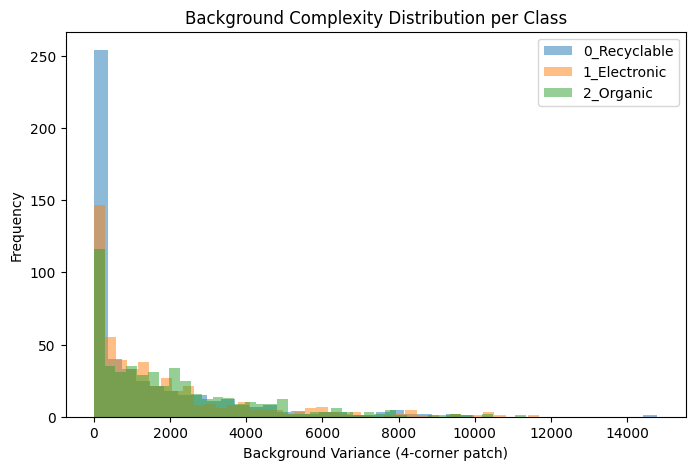

In [10]:
# Cell 7 — Background complexity analysis per class
import numpy as np

# Estimate background complexity from corner patch variance
# Low variance -> plain/studio background | High variance -> complex/natural background
def compute_background_complexity(img, patch_size=30):
    arr = np.array(img)
    h, w, _ = arr.shape
    p = patch_size
    corners = [
        arr[0:p, 0:p],
        arr[0:p, w-p:w],
        arr[h-p:h, 0:p],
        arr[h-p:h, w-p:w],
    ]
    return np.mean([c.var() for c in corners])

bg_results = []
for cls, files in sampled_files.items():
    for f in files:
        try:
            img = Image.open(f).convert("RGB")
            bg_results.append({
                "class":       cls,
                "file":        str(f),
                "bg_variance": compute_background_complexity(img),
            })
        except Exception:
            pass

df_bg = pd.DataFrame(bg_results)

print("Background variance statistics per class:")
print(df_bg.groupby("class")["bg_variance"].describe())

threshold = 50
df_bg["is_plain_bg"] = df_bg["bg_variance"] < threshold
print("\nProportion of plain-background images (variance < 50) per class:")
print(df_bg.groupby("class")["is_plain_bg"].mean())

fig, ax = plt.subplots(figsize=(8, 5))
for cls in class_folders:
    subset = df_bg[df_bg["class"] == cls]["bg_variance"]
    ax.hist(subset, bins=40, alpha=0.5, label=cls)
ax.set_xlabel("Background Variance (4-corner patch)")
ax.set_ylabel("Frequency")
ax.set_title("Background Complexity Distribution per Class")
ax.legend()
plt.show()

In [11]:
# Cell 8 — Image dimension, aspect ratio, and orientation analysis per class
dim_results = []
for cls, files in sampled_files.items():
    for f in files:
        try:
            with Image.open(f) as img:
                w, h = img.size
                dim_results.append({
                    "class":        cls,
                    "file":         str(f),
                    "width":        w,
                    "height":       h,
                    "aspect_ratio": round(w / h, 3),
                    "orientation":  "square" if abs(w - h) <= 5
                                    else ("landscape" if w > h else "portrait"),
                })
        except Exception:
            pass

df_dim = pd.DataFrame(dim_results)

print("Width & height statistics per class:")
print(df_dim.groupby("class")[["width", "height"]].describe())

print("\nAspect ratio statistics per class:")
print(df_dim.groupby("class")["aspect_ratio"].describe())

print("\nOrientation distribution per class (proportion):")
print(pd.crosstab(df_dim["class"], df_dim["orientation"], normalize="index").round(3))

Width & height statistics per class:
              width                                                            \
              count     mean          std    min    25%    50%    75%     max   
class                                                                           
0_Recyclable  500.0  240.584    47.188733   70.0  224.0  225.0  268.0   569.0   
1_Electronic  500.0  650.048  1027.635367  150.0  150.0  150.0  800.0  6016.0   
2_Organic     500.0  260.688    43.670091  168.0  225.0  267.0  284.0   517.0   

             height                                                           
              count     mean         std    min    25%    50%    75%     max  
class                                                                         
0_Recyclable  500.0  213.122   33.593215   88.0  187.0  225.0  225.0   310.0  
1_Electronic  500.0  565.490  894.203835  150.0  150.0  150.0  640.0  4608.0  
2_Organic     500.0  198.422   34.211764   97.0  177.0  189.0  225.0   300.0  

A

Electronic images with exact 150x150 size: 325 / 500 (65.0%)

Width statistics for Electronic images that are NOT 150x150:
count     175.000000
mean     1578.708571
std      1301.576758
min       250.000000
25%       771.500000
50%      1152.000000
75%      1959.500000
max      6016.000000
Name: width, dtype: float64


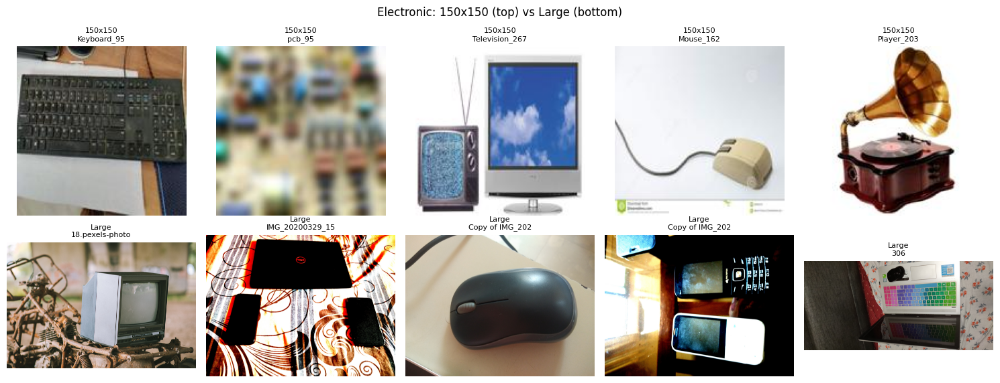

In [12]:
# Cell 9 — Electronic subgroup analysis: 150x150 icon vs larger images
electronic_dims = df_dim[df_dim["class"] == "1_Electronic"].copy()
electronic_dims["is_small_150"] = (
    (electronic_dims["width"] == 150) & (electronic_dims["height"] == 150)
)

n_small = electronic_dims["is_small_150"].sum()
n_total = len(electronic_dims)
print(f"Electronic images with exact 150x150 size: {n_small} / {n_total} ({n_small/n_total:.1%})")

print("\nWidth statistics for Electronic images that are NOT 150x150:")
print(electronic_dims[~electronic_dims["is_small_150"]]["width"].describe())

small_samples = electronic_dims[electronic_dims["is_small_150"]]["file"].head(5).tolist()
large_samples = (
    electronic_dims[~electronic_dims["is_small_150"]]
    .sort_values("width", ascending=False)["file"]
    .head(5).tolist()
)

fig, axes = plt.subplots(2, 5, figsize=(15, 6))
for i, f in enumerate(small_samples):
    axes[0, i].imshow(Image.open(f))
    axes[0, i].set_title(f"150x150\n{Path(f).stem[:15]}", fontsize=8)
    axes[0, i].axis("off")
for i, f in enumerate(large_samples):
    axes[1, i].imshow(Image.open(f))
    axes[1, i].set_title(f"Large\n{Path(f).stem[:15]}", fontsize=8)
    axes[1, i].axis("off")
plt.suptitle("Electronic: 150x150 (top) vs Large (bottom)")
plt.tight_layout()
plt.show()

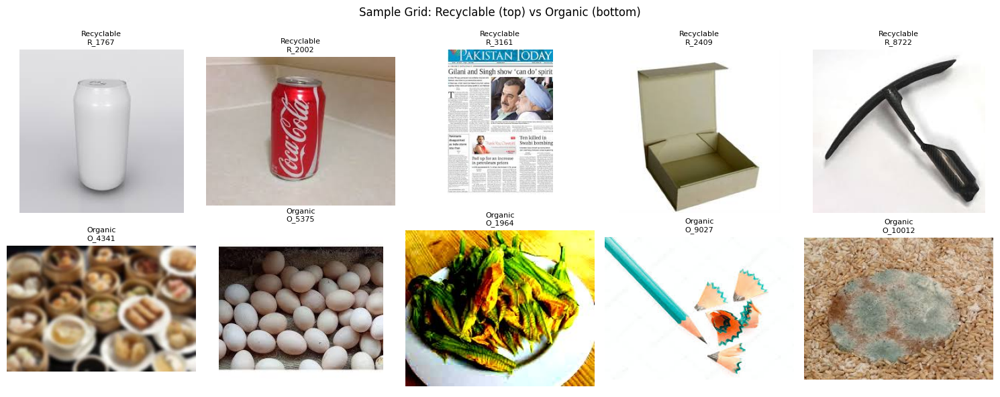

In [13]:
# Cell 10 — Visual comparison: Recyclable vs Organic samples
random.seed(42)
recyclable_samples = random.sample(sampled_files["0_Recyclable"], 5)
organic_samples    = random.sample(sampled_files["2_Organic"], 5)

fig, axes = plt.subplots(2, 5, figsize=(15, 6))

for i, f in enumerate(recyclable_samples):
    axes[0, i].imshow(Image.open(f))
    axes[0, i].set_title(f"Recyclable\n{Path(f).stem[:15]}", fontsize=8)
    axes[0, i].axis("off")

for i, f in enumerate(organic_samples):
    axes[1, i].imshow(Image.open(f))
    axes[1, i].set_title(f"Organic\n{Path(f).stem[:15]}", fontsize=8)
    axes[1, i].axis("off")

plt.suptitle("Sample Grid: Recyclable (top) vs Organic (bottom)")
plt.tight_layout()
plt.show()

Brightness statistics per class:
              count        mean        std        min         25%         50%  \
class                                                                           
0_Recyclable  500.0  183.662639  48.495278  23.606074  145.218546  196.751573   
1_Electronic  500.0  137.899690  47.020066  28.665748  102.957339  130.240031   
2_Organic     500.0  143.053240  47.400038  29.767454  105.832796  136.074781   

                     75%         max  
class                                 
0_Recyclable  223.951743  254.093867  
1_Electronic  171.121721  245.752815  
2_Organic     182.308912  243.392869  

Mean color channel (R/G/B) per class:
                  r_mean      g_mean      b_mean
class                                           
0_Recyclable  188.765348  183.583097  178.639472
1_Electronic  141.325419  138.279986  134.093665
2_Organic     164.619143  148.098794  116.441782


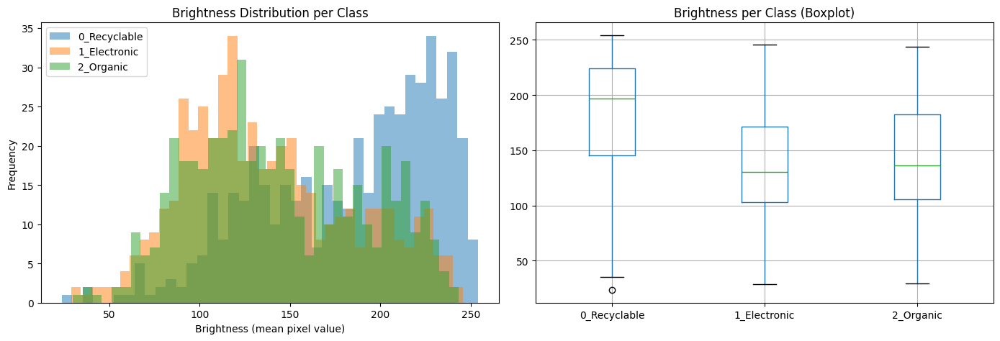

In [14]:
# Cell 11 — Brightness and per-channel color mean analysis per class
brightness_results = []

for cls, files in sampled_files.items():
    for f in files:
        try:
            with Image.open(f) as img:
                arr = np.array(img.convert("RGB"))
                brightness_results.append({
                    "class":      cls,
                    "file":       str(f),
                    "brightness": arr.mean(),
                    "r_mean":     arr[:, :, 0].mean(),
                    "g_mean":     arr[:, :, 1].mean(),
                    "b_mean":     arr[:, :, 2].mean(),
                })
        except Exception:
            pass

df_brightness = pd.DataFrame(brightness_results)

print("Brightness statistics per class:")
print(df_brightness.groupby("class")["brightness"].describe())

print("\nMean color channel (R/G/B) per class:")
print(df_brightness.groupby("class")[["r_mean", "g_mean", "b_mean"]].mean())

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

for cls in class_folders:
    subset = df_brightness[df_brightness["class"] == cls]["brightness"]
    axes[0].hist(subset, bins=40, alpha=0.5, label=cls)
axes[0].set_xlabel("Brightness (mean pixel value)")
axes[0].set_ylabel("Frequency")
axes[0].set_title("Brightness Distribution per Class")
axes[0].legend()

df_brightness.boxplot(column="brightness", by="class", ax=axes[1])
axes[1].set_title("Brightness per Class (Boxplot)")
axes[1].set_xlabel("")
plt.suptitle("")
plt.tight_layout()
plt.show()

In [15]:
# Cell 12 — Assign fold indices via StratifiedGroupKFold
from sklearn.model_selection import StratifiedGroupKFold

N_SPLITS = 5
SEED     = 42

cv_pool = train_master[
    (~train_master["exclude_from_cv"]) & (~train_master["exclude_from_training"])
].reset_index(drop=True)

print("CV pool size:", len(cv_pool))
print("Unique groups in CV pool:", cv_pool["duplicate_group_id"].nunique())

sgkf = StratifiedGroupKFold(n_splits=N_SPLITS, shuffle=True, random_state=SEED)

cv_pool["fold"] = -1

X      = cv_pool["filename"]
y      = cv_pool["label"]
groups = cv_pool["duplicate_group_id"]

for fold_idx, (train_idx, val_idx) in enumerate(sgkf.split(X, y, groups)):
    cv_pool.loc[val_idx, "fold"] = fold_idx

assert (cv_pool["fold"] == -1).sum() == 0, "Some rows were not assigned a fold!"
print(cv_pool["fold"].value_counts().sort_index())

CV pool size: 26429
Unique groups in CV pool: 26366
fold
0    5286
1    5286
2    5284
3    5286
4    5287
Name: count, dtype: int64


In [16]:
# Cell 13 — Validate fold assignments: group integrity, class balance, fold size
# 1) No group should be split across multiple folds
group_fold_check = cv_pool.groupby("duplicate_group_id")["fold"].nunique()
leaky_groups     = group_fold_check[group_fold_check > 1]
assert len(leaky_groups) == 0, (
    f"GROUP LEAKAGE: {len(leaky_groups)} groups span multiple folds!\n{leaky_groups}"
)
print("Group integrity check: PASSED (no group spans multiple folds)")

# 2) Class balance per fold
balance             = cv_pool.groupby("fold")["label"].value_counts(normalize=True).unstack().round(4)
balance.columns     = ["Recyclable", "Electronic", "Organic"]
print(balance)

# Deviation from global class ratio
global_ratio        = cv_pool["label"].value_counts(normalize=True).sort_index()
global_ratio.index  = ["Recyclable", "Electronic", "Organic"]
deviation           = (balance - global_ratio).abs().round(4)
print("\nAbsolute deviation from global class ratio (global = {}):".format(
    global_ratio.round(4).to_dict()
))
print(deviation)

max_dev = deviation.values.max()
print(f"\nMax deviation across all folds/classes: {max_dev:.4f}")
if max_dev > 0.02:
    print("Warning: deviation > 2pp — flag before Phase 1 baseline training.")
else:
    print("OK: deviation within acceptable range (<2pp).")

# 3) Fold size check
print("\nFold sizes:")
print(cv_pool["fold"].value_counts().sort_index())

Group integrity check: PASSED (no group spans multiple folds)
      Recyclable  Electronic  Organic
fold                                 
0         0.3784      0.1500   0.4716
1         0.3784      0.1498   0.4718
2         0.3781      0.1499   0.4720
3         0.3784      0.1493   0.4724
4         0.3785      0.1500   0.4715

Absolute deviation from global class ratio (global = {'Recyclable': 0.3783, 'Electronic': 0.1498, 'Organic': 0.4719}):
      Recyclable  Electronic  Organic
fold                                 
0         0.0001      0.0002   0.0003
1         0.0001      0.0000   0.0001
2         0.0002      0.0001   0.0001
3         0.0001      0.0005   0.0005
4         0.0002      0.0002   0.0004

Max deviation across all folds/classes: 0.0005
OK: deviation within acceptable range (<2pp).

Fold sizes:
fold
0    5286
1    5286
2    5284
3    5286
4    5287
Name: count, dtype: int64


In [17]:
# Cell 14 — Merge fold assignments into train_master and save
# Rows not in cv_pool (excluded files) get fold = -1
fold_map = dict(zip(cv_pool["filename"], cv_pool["fold"]))
train_master["fold"] = train_master["filename"].map(fold_map).fillna(-1).astype(int)

train_master.to_csv(output_dir / "train_master_with_folds.csv", index=False)
print("Saved train_master_with_folds.csv")
train_master["fold"].value_counts().sort_index()

Saved train_master_with_folds.csv


fold
-1      98
 0    5286
 1    5286
 2    5284
 3    5286
 4    5287
Name: count, dtype: int64

In [18]:
# Cell 15 — Load submission.csv and build test filepaths
submission_df = pd.read_csv(submission_path)
print(submission_df.shape)
print(submission_df.head())
print(submission_df.dtypes)

# Build filename from id column (test files are named "{id}.jpg")
submission_df["filename"] = submission_df["id"].astype(str) + ".jpg"
submission_df["filepath"] = submission_df["filename"].apply(lambda f: str(test_dir / f))

# Verify all expected test files exist on disk
missing = submission_df[~submission_df["filepath"].apply(lambda p: Path(p).exists())]
assert len(missing) == 0, f"Missing test files: {missing['filename'].tolist()}"

print(f"\nAll {len(submission_df)} test files found on disk, matching submission.csv order.")
submission_df.head()

(1458, 2)
   id  predicted
0   1        NaN
1   2        NaN
2   3        NaN
3   4        NaN
4   5        NaN
id             int64
predicted    float64
dtype: object

All 1458 test files found on disk, matching submission.csv order.


,id,predicted,filename,filepath
0,1,NaN,1.jpg,/kaggle/input/datasets/ababilkhoerulimam/bdc-s...
1,2,NaN,2.jpg,/kaggle/input/datasets/ababilkhoerulimam/bdc-s...
2,3,NaN,3.jpg,/kaggle/input/datasets/ababilkhoerulimam/bdc-s...
3,4,NaN,4.jpg,/kaggle/input/datasets/ababilkhoerulimam/bdc-s...
4,5,NaN,5.jpg,/kaggle/input/datasets/ababilkhoerulimam/bdc-s...


In [19]:
# Cell 16 — Audit image mode distribution across train and test
from PIL import Image

def get_image_mode(filepath):
    try:
        with Image.open(filepath) as img:
            return img.mode
    except Exception as e:
        return f"ERROR: {e}"

train_master["img_mode"]  = train_master["filepath"].apply(get_image_mode)
submission_df["img_mode"] = submission_df["filepath"].apply(get_image_mode)

print("Train mode distribution:")
print(train_master["img_mode"].value_counts())
print("\nTest mode distribution:")
print(submission_df["img_mode"].value_counts())

non_rgb_train = train_master[train_master["img_mode"] != "RGB"]
non_rgb_test  = submission_df[submission_df["img_mode"] != "RGB"]
print(f"\nNon-RGB train files: {len(non_rgb_train)} (expected 312: 293 Palette + 17 RGBA + 2 Grayscale)")
print(f"Non-RGB test files : {len(non_rgb_test)}")

Train mode distribution:
img_mode
RGB     26215
P         293
RGBA       17
L           2
Name: count, dtype: int64

Test mode distribution:
img_mode
RGB    1453
P         5
Name: count, dtype: int64

Non-RGB train files: 312 (expected 312: 293 Palette + 17 RGBA + 2 Grayscale)
Non-RGB test files : 5


In [20]:
# Cell 17 — Define robust RGB image loader
def load_image_as_rgb(filepath):
    """
    Always returns a PIL Image in RGB mode.
    Handles RGBA (composites on white background to avoid black artifacts),
    Palette (P), Grayscale (L), and CMYK edge cases.
    """
    img = Image.open(filepath)

    if img.mode == "RGBA":
        # Composite onto white background — avoids black halos where alpha=0
        background = Image.new("RGB", img.size, (255, 255, 255))
        background.paste(img, mask=img.split()[3])
        img = background
    elif img.mode != "RGB":
        img = img.convert("RGB")

    return img

# Verify on a known RGBA sample
sample_non_rgb = train_master[train_master["img_mode"] == "RGBA"]
if len(sample_non_rgb) > 0:
    test_fp   = sample_non_rgb.iloc[0]["filepath"]
    converted = load_image_as_rgb(test_fp)
    print(f"Tested on: {test_fp}")
    print(f"Converted mode: {converted.mode}, size: {converted.size}")
else:
    print("No RGBA sample found in train_master.")

Tested on: /kaggle/input/datasets/ababilkhoerulimam/bdc-satria-data-2026/BDC2026/train/1_Electronic/73.314-3144875_resolving-laptop-screen-issues-damaged-laptop.png
Converted mode: RGB, size: (448, 293)


In [21]:
# Cell 18 — Verify RGB conversion for all non-RGB modes
modes_to_test = ["P", "RGBA", "L"]

for mode in modes_to_test:
    sample = train_master[train_master["img_mode"] == mode]
    if len(sample) == 0:
        print(f"No {mode} sample found, skipping")
        continue
    fp = sample.iloc[0]["filepath"]
    try:
        converted = load_image_as_rgb(fp)
        assert converted.mode == "RGB", f"Conversion failed for {mode}: got {converted.mode}"
        print(f"OK: {mode} -> RGB | sample: {Path(fp).name} | size: {converted.size}")
    except Exception as e:
        print(f"Failed: {mode} conversion error: {e}")

# Verify all test Palette files convert cleanly
test_palette_samples = submission_df[submission_df["img_mode"] == "P"]
print(f"\nVerifying all {len(test_palette_samples)} test Palette files convert cleanly:")
for _, row in test_palette_samples.iterrows():
    converted = load_image_as_rgb(row["filepath"])
    assert converted.mode == "RGB"
print("OK: all test Palette files convert successfully.")

OK: P -> RGB | sample: R_6347.jpg | size: (262, 193)
OK: RGBA -> RGB | sample: 73.314-3144875_resolving-laptop-screen-issues-damaged-laptop.png | size: (448, 293)
OK: L -> RGB | sample: 615.jpg | size: (3496, 3496)

Verifying all 5 test Palette files convert cleanly:
OK: all test Palette files convert successfully.


In [22]:
# Cell 19 — WasteDataset
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T

class WasteDataset(Dataset):
    def __init__(self, df, transform=None, is_test=False):
        """
        df        : DataFrame with at least ['filepath'] column,
                    and ['label'] if not is_test.
        transform : torchvision transform pipeline applied after RGB conversion.
        is_test   : if True, returns (image, filename) instead of (image, label).
        """
        self.df        = df.reset_index(drop=True)
        self.transform = transform
        self.is_test   = is_test

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = load_image_as_rgb(row["filepath"])

        if self.transform:
            img = self.transform(img)

        if self.is_test:
            return img, row["filename"]
        else:
            return img, int(row["label"])

In [23]:
# Cell 20 — Define train and eval transforms
IMG_SIZE = 224  # baseline resolution for ConvNeXt V2 pretrained models

# Train: RandAugment + HFlip + limited ColorJitter + normalization
train_transform = T.Compose([
    T.Resize((IMG_SIZE, IMG_SIZE), interpolation=T.InterpolationMode.LANCZOS),
    T.RandomHorizontalFlip(p=0.5),
    T.RandAugment(num_ops=2, magnitude=7),
    T.ColorJitter(brightness=0.15, contrast=0.1, saturation=0.1),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Val/Test: deterministic, no augmentation
eval_transform = T.Compose([
    T.Resize((IMG_SIZE, IMG_SIZE), interpolation=T.InterpolationMode.LANCZOS),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

print(f"Transforms ready. Baseline resolution: {IMG_SIZE}x{IMG_SIZE}")

Transforms ready. Baseline resolution: 224x224


In [24]:
# Cell 21 — Build DataLoaders for fold 0 baseline
BATCH_SIZE   = 64  # ConvNeXt V2-Tiny @ 224px, 16GB VRAM baseline
NUM_WORKERS  = 4

fold_df          = pd.read_csv(output_dir / "train_master_with_folds.csv")
FOLD_TO_VALIDATE = 0

train_df = fold_df[(fold_df["fold"] != FOLD_TO_VALIDATE) & (fold_df["fold"] != -1)].reset_index(drop=True)
val_df   = fold_df[fold_df["fold"] == FOLD_TO_VALIDATE].reset_index(drop=True)

print(f"Train size: {len(train_df)}, Val size: {len(val_df)}")
print(f"Train label distribution:\n{train_df['label'].value_counts(normalize=True).sort_index()}")
print(f"Val label distribution:\n{val_df['label'].value_counts(normalize=True).sort_index()}")

train_dataset = WasteDataset(train_df, transform=train_transform, is_test=False)
val_dataset   = WasteDataset(val_df,   transform=eval_transform,  is_test=False)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,
                          num_workers=NUM_WORKERS, pin_memory=True)
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False,
                          num_workers=NUM_WORKERS, pin_memory=True)

print(f"\nTrain batches: {len(train_loader)}, Val batches: {len(val_loader)}")

Train size: 21143, Val size: 5286
Train label distribution:
label
0    0.378329
1    0.149742
2    0.471929
Name: proportion, dtype: float64
Val label distribution:
label
0    0.378358
1    0.150019
2    0.471623
Name: proportion, dtype: float64

Train batches: 331, Val batches: 83


In [25]:
# Cell 22 — Sanity check batch shapes and pixel value range
images, labels = next(iter(train_loader))
print("Train batch images shape:", images.shape)   # expect [BATCH_SIZE, 3, 224, 224]
print("Train batch images dtype:", images.dtype)
print("Train batch labels shape:", labels.shape)
print("Train batch labels unique:", labels.unique())
print("Pixel value range (post-normalize):", images.min().item(), "to", images.max().item())

test_dataset = WasteDataset(submission_df, transform=eval_transform, is_test=True)
test_loader  = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False,
                          num_workers=NUM_WORKERS, pin_memory=True)

test_images, test_filenames = next(iter(test_loader))
print("\nTest batch images shape:", test_images.shape)
print("Test batch filenames (first 5):", test_filenames[:5])

Train batch images shape: torch.Size([64, 3, 224, 224])
Train batch images dtype: torch.float32
Train batch labels shape: torch.Size([64])
Train batch labels unique: tensor([0, 1, 2])
Pixel value range (post-normalize): -2.1179039478302 to 2.640000104904175

Test batch images shape: torch.Size([64, 3, 224, 224])
Test batch filenames (first 5): ('1.jpg', '2.jpg', '3.jpg', '4.jpg', '5.jpg')


In [26]:
# Cell 23 — Install timm and import training utilities
!pip install -q timm

import timm
import torch
import torch.nn as nn
import torch.optim as optim
from torch.amp import GradScaler, autocast

print(f"PyTorch version : {torch.__version__}")
print(f"CUDA available  : {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU             : {torch.cuda.get_device_name(0)}")
    print(f"VRAM            : {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")
print(f"timm version    : {timm.__version__}")

PyTorch version : 2.10.0+cu128
CUDA available  : True
GPU             : Tesla T4
VRAM            : 15.6 GB
timm version    : 1.0.26


In [27]:
# Cell 24 — Build ConvNeXt V2-Tiny with 3-class head
DEVICE      = torch.device("cuda" if torch.cuda.is_available() else "cpu")
NUM_CLASSES = 3

model = timm.create_model(
    "convnextv2_tiny.fcmae_ft_in22k_in1k",
    pretrained=True,
    num_classes=NUM_CLASSES,
)
model = model.to(DEVICE)

n_params    = sum(p.numel() for p in model.parameters())
n_trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Model      : convnextv2_tiny")
print(f"Total params    : {n_params:,}")
print(f"Trainable params: {n_trainable:,}")
print(f"Device          : {DEVICE}")

model.safetensors:   0%|          | 0.00/115M [00:00<?, ?B/s]

Model      : convnextv2_tiny
Total params    : 27,868,803
Trainable params: 27,868,803
Device          : cuda


In [28]:
# Cell 25 — Discriminative learning rate setup
BACKBONE_LR  = 1e-5
HEAD_LR      = 1e-4
WEIGHT_DECAY = 0.05

print("Model head structure:")
print(model.head)

# Split params: head vs backbone
head_params      = list(model.head.parameters())
head_param_ids   = {id(p) for p in head_params}
backbone_params  = [p for p in model.parameters() if id(p) not in head_param_ids]

optimizer = optim.AdamW([
    {"params": backbone_params, "lr": BACKBONE_LR},
    {"params": head_params,     "lr": HEAD_LR},
], weight_decay=WEIGHT_DECAY)

print(f"\nBackbone params : {sum(p.numel() for p in backbone_params):,} @ LR={BACKBONE_LR}")
print(f"Head params     : {sum(p.numel() for p in head_params):,} @ LR={HEAD_LR}")

Model head structure:
NormMlpClassifierHead(
  (global_pool): SelectAdaptivePool2d(pool_type=avg, flatten=Identity())
  (norm): LayerNorm2d((768,), eps=1e-06, elementwise_affine=True)
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (pre_logits): Identity()
  (drop): Dropout(p=0.0, inplace=False)
  (fc): Linear(in_features=768, out_features=3, bias=True)
)

Backbone params : 27,864,960 @ LR=1e-05
Head params     : 3,843 @ LR=0.0001


In [29]:
# Cell 26 — Loss, cosine scheduler with warmup, AMP scaler
NUM_EPOCHS          = 15
WARMUP_STEPS_RATIO  = 0.075  # 7.5% of total steps

# Plain CrossEntropy — no class weights, per Phase 1 lock
criterion    = nn.CrossEntropyLoss()

total_steps  = len(train_loader) * NUM_EPOCHS
warmup_steps = int(total_steps * WARMUP_STEPS_RATIO)

def lr_lambda(current_step):
    if current_step < warmup_steps:
        return float(current_step) / float(max(1, warmup_steps))
    progress = float(current_step - warmup_steps) / float(max(1, total_steps - warmup_steps))
    return 0.5 * (1.0 + torch.cos(torch.tensor(progress * 3.14159265)).item())

scheduler = optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=lr_lambda)
scaler    = GradScaler("cuda")

print(f"Loss        : CrossEntropyLoss (plain, no weights)")
print(f"Total steps : {total_steps}, Warmup steps: {warmup_steps} ({WARMUP_STEPS_RATIO*100:.1f}%)")
print(f"AMP scaler  : {scaler}")

Loss        : CrossEntropyLoss (plain, no weights)
Total steps : 4965, Warmup steps: 372 (7.5%)
AMP scaler  : <torch.amp.grad_scaler.GradScaler object at 0x7eb2268ce330>


In [33]:
# Cell 27 — Training loop
from sklearn.metrics import f1_score
import numpy as np
import time
import glob

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model  = model.to(device)

# Attempt to resume from existing checkpoint
CHECKPOINT_SEARCH_PATHS = [
    "/kaggle/input/datasets/*/phase0/*.pt",
    str(output_dir / "*.pt"),
]

found_checkpoints = []
for pattern in CHECKPOINT_SEARCH_PATHS:
    found_checkpoints.extend(glob.glob(pattern))

start_epoch  = 0
best_val_f1  = 0.0
best_epoch   = -1
history      = []

if found_checkpoints:
    def extract_score(path):
        try:
            return float(os.path.basename(path).split("_cv")[-1].replace(".pt", ""))
        except Exception:
            return -1.0

    best_checkpoint_path = max(found_checkpoints, key=extract_score)
    print(f"Checkpoint found: {best_checkpoint_path}")

    try:
        checkpoint = torch.load(best_checkpoint_path, map_location=device)
        model.load_state_dict(checkpoint["model_state_dict"])
        if "optimizer_state_dict" in checkpoint:
            try:
                optimizer.load_state_dict(checkpoint["optimizer_state_dict"])
            except Exception as opt_err:
                print(f"Optimizer state not restored: {opt_err}")
        start_epoch = checkpoint.get("epoch", 0)
        best_val_f1 = checkpoint.get("val_macro_f1", 0.0)
        best_epoch  = start_epoch
        print(f"Resumed from epoch {start_epoch}, val_macro_f1={best_val_f1:.4f}")
    except Exception as e:
        print(f"Failed to load checkpoint ({e}). Training from scratch.")
        start_epoch = 0
        best_val_f1 = 0.0
        best_epoch  = -1
else:
    print("No checkpoint found. Training from scratch.")

# Training loop
for epoch in range(start_epoch, NUM_EPOCHS):
    epoch_start = time.time()

    # Train
    model.train()
    train_loss_sum = 0.0
    train_correct  = 0
    train_total    = 0

    for images, labels in train_loader:
        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)

        with autocast("cuda"):
            outputs = model(images)
            loss    = criterion(outputs, labels)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        scheduler.step()

        train_loss_sum += loss.item() * images.size(0)
        preds           = outputs.argmax(dim=1)
        train_correct  += (preds == labels).sum().item()
        train_total    += images.size(0)

    train_loss = train_loss_sum / train_total
    train_acc  = train_correct / train_total

    # Validate
    model.eval()
    val_loss_sum   = 0.0
    val_preds_all  = []
    val_labels_all = []

    with torch.no_grad():
        for images, labels in val_loader:
            images = images.to(device, non_blocking=True)
            labels = labels.to(device, non_blocking=True)

            with autocast("cuda"):
                outputs = model(images)
                loss    = criterion(outputs, labels)

            val_loss_sum += loss.item() * images.size(0)
            preds         = outputs.argmax(dim=1)
            val_preds_all.extend(preds.cpu().numpy().tolist())
            val_labels_all.extend(labels.cpu().numpy().tolist())

    val_loss        = val_loss_sum / len(val_labels_all)
    val_macro_f1    = f1_score(val_labels_all, val_preds_all, average="macro")
    val_f1_per_class = f1_score(val_labels_all, val_preds_all, average=None)
    epoch_time      = time.time() - epoch_start

    current_lr_backbone = optimizer.param_groups[0]["lr"]
    current_lr_head     = optimizer.param_groups[1]["lr"]

    print(
        f"Epoch {epoch+1}/{NUM_EPOCHS} | "
        f"train_loss={train_loss:.4f} train_acc={train_acc:.4f} | "
        f"val_loss={val_loss:.4f} val_macro_f1={val_macro_f1:.4f} | "
        f"F1[Recy={val_f1_per_class[0]:.3f}, Elec={val_f1_per_class[1]:.3f}, Org={val_f1_per_class[2]:.3f}] | "
        f"LR[bb={current_lr_backbone:.2e}, head={current_lr_head:.2e}] | "
        f"time={epoch_time:.1f}s"
    )

    history.append({
        "epoch":             epoch + 1,
        "train_loss":        train_loss,
        "train_acc":         train_acc,
        "val_loss":          val_loss,
        "val_macro_f1":      val_macro_f1,
        "val_f1_recyclable": val_f1_per_class[0],
        "val_f1_electronic": val_f1_per_class[1],
        "val_f1_organic":    val_f1_per_class[2],
    })

    if val_macro_f1 > best_val_f1:
        best_val_f1   = val_macro_f1
        best_epoch    = epoch + 1
        checkpoint_path = os.path.join(output_dir, f"model_s9_baseline_cv{best_val_f1:.4f}.pt")
        torch.save({
            "epoch":                epoch + 1,
            "model_state_dict":     model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "val_macro_f1":         val_macro_f1,
            "val_f1_per_class":     val_f1_per_class.tolist(),
        }, checkpoint_path)
        print(f"  -> New best checkpoint saved: {checkpoint_path}")

print(f"\nTraining complete. Best val_macro_f1={best_val_f1:.4f} at epoch {best_epoch}")

# Save full epoch history
history_df  = pd.DataFrame(history)
print(history_df.to_string(index=False, float_format=lambda x: f"{x:.4f}"))

history_csv = os.path.join(output_dir, "training_history_baseline.csv")
history_df.to_csv(history_csv, index=False)
print(f"\nHistory saved to {history_csv}")

Checkpoint found: /kaggle/input/datasets/ababilkhoerulimam/phase0/model_s9_baseline_cv0.9827.pt
Resumed from epoch 14, val_macro_f1=0.9827
Epoch 15/15 | train_loss=0.0084 train_acc=0.9979 | val_loss=0.0773 val_macro_f1=0.9814 | F1[Recy=0.972, Elec=0.994, Org=0.978] | LR[bb=1.00e-05, head=1.00e-04] | time=237.4s

Training complete. Best val_macro_f1=0.9827 at epoch 14
 epoch  train_loss  train_acc  val_loss  val_macro_f1  val_f1_recyclable  val_f1_electronic  val_f1_organic
    15      0.0084     0.9979    0.0773        0.9814             0.9719             0.9937          0.9784

History saved to /kaggle/working/training_history_baseline.csv


In [34]:
# Cell 28 — Electronic subpopulation sensitivity check: icon 150x150 vs natural photo
# Requires val_loader with shuffle=False and val_df in same order
model.eval()
val_preds_all  = []
val_labels_all = []

with torch.no_grad():
    for images, labels in val_loader:
        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)
        with autocast("cuda"):
            outputs = model(images)
        preds = outputs.argmax(dim=1)
        val_preds_all.extend(preds.cpu().numpy().tolist())
        val_labels_all.extend(labels.cpu().numpy().tolist())

val_filepaths_all = val_df["filepath"].tolist()
assert len(val_filepaths_all) == len(val_labels_all), (
    "Mismatch: val_df order must match val_loader (shuffle=False required)"
)

# Detect subpopulation by actual image dimensions
def get_image_dims(filepath):
    try:
        with Image.open(filepath) as img:
            return img.size
    except Exception:
        return (None, None)

val_dims        = [get_image_dims(fp) for fp in val_filepaths_all]
is_icon         = [(w == 150 and h == 150) for w, h in val_dims]

val_labels_np   = np.array(val_labels_all)
val_preds_np    = np.array(val_preds_all)
is_icon_np      = np.array(is_icon)
electronic_mask = (val_labels_np == 1)

icon_mask    = electronic_mask & is_icon_np
natural_mask = electronic_mask & ~is_icon_np

print(f"Total Electronic in val : {electronic_mask.sum()}")
print(f"  Icon (150x150)        : {icon_mask.sum()} ({icon_mask.sum()/electronic_mask.sum()*100:.1f}%)")
print(f"  Natural (other)       : {natural_mask.sum()} ({natural_mask.sum()/electronic_mask.sum()*100:.1f}%)")

icon_correct    = (val_preds_np[icon_mask] == 1).sum()
natural_correct = (val_preds_np[natural_mask] == 1).sum()
icon_acc        = icon_correct / icon_mask.sum() if icon_mask.sum() > 0 else float("nan")
natural_acc     = natural_correct / natural_mask.sum() if natural_mask.sum() > 0 else float("nan")

print(f"\nRecall per subpopulation:")
print(f"Icon (150x150) : {icon_acc:.4f} ({icon_correct}/{icon_mask.sum()})")
print(f"Natural photo  : {natural_acc:.4f} ({natural_correct}/{natural_mask.sum()})")

if not np.isnan(icon_acc) and not np.isnan(natural_acc):
    gap = abs(icon_acc - natural_acc)
    print(f"\nGap: {gap:.4f}")
    if gap > 0.05:
        print("Warning: gap > 5pp — model may be exploiting visual shortcuts (size/format).")
    else:
        print("OK: gap within acceptable range.")

Total Electronic in val : 793
  Icon (150x150)        : 549 (69.2%)
  Natural (other)       : 244 (30.8%)

Recall per subpopulation:
Icon (150x150) : 0.9982 (548/549)
Natural photo  : 0.9877 (241/244)

Gap: 0.0105
OK: gap within acceptable range.


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 103.7 MB/s eta 0:00:0000:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
Sample counts per group:
  Recyclable_PlainBG (shortcut risk): 5 samples
  Recyclable_ComplexBG (control): 3 samples
  Electronic_Icon150 (shortcut risk): 5 samples
  Electronic_Natural (control): 3 samples


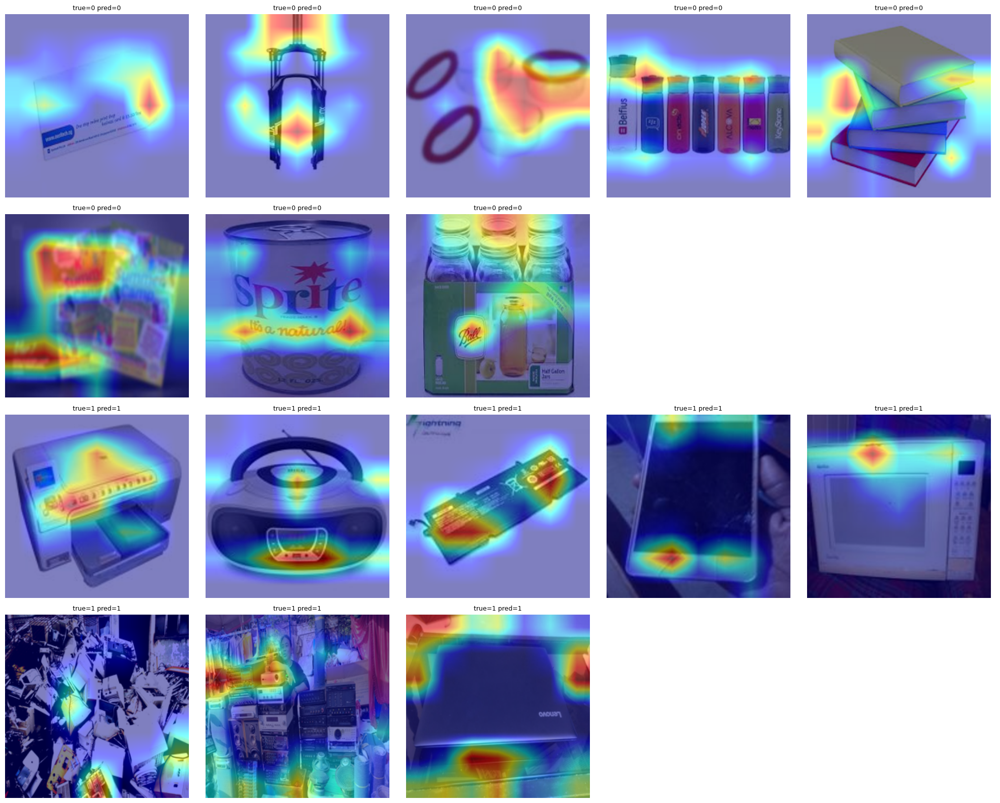

Saved to /kaggle/working/gradcam_shortcut_check.png


In [35]:
# Cell 29 — Grad-CAM shortcut check
!pip install grad-cam --quiet

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
import matplotlib.pyplot as plt

# Target last conv stage before head
target_layers = [model.stages[-1]]

def load_and_preprocess(filepath):
    img        = Image.open(filepath).convert("RGB")
    img_resized = img.resize((224, 224))
    img_np     = np.array(img_resized).astype(np.float32) / 255.0
    mean       = np.array([0.485, 0.456, 0.406])
    std        = np.array([0.229, 0.224, 0.225])
    img_norm   = (img_np - mean) / std
    tensor     = torch.from_numpy(img_norm.transpose(2, 0, 1)).unsqueeze(0).float().to(device)
    return img_np, tensor

# Build sample groups: shortcut risk vs control
def compute_bg_variance(filepath, patch_size=30):
    try:
        img = Image.open(filepath).convert("RGB")
        arr = np.array(img)
        h, w, _ = arr.shape
        corners = [
            arr[:patch_size, :patch_size],
            arr[:patch_size, -patch_size:],
            arr[-patch_size:, :patch_size],
            arr[-patch_size:, -patch_size:],
        ]
        return np.mean([c.var() for c in corners])
    except Exception:
        return None

recyclable_indices = np.where(val_labels_np == 0)[0]
electronic_indices = np.where(val_labels_np == 1)[0]

recyclable_bg_var  = {
    idx: compute_bg_variance(val_filepaths_all[idx])
    for idx in recyclable_indices[:200]
}
recyclable_plain   = [idx for idx, v in recyclable_bg_var.items() if v is not None and v < 50]
recyclable_complex = [idx for idx, v in recyclable_bg_var.items() if v is not None and v >= 50]
electronic_icon    = [idx for idx in electronic_indices if is_icon_np[idx]]
electronic_natural = [idx for idx in electronic_indices if not is_icon_np[idx]]

np.random.seed(42)
sample_groups = {
    "Recyclable_PlainBG (shortcut risk)":  np.random.choice(recyclable_plain,   min(5, len(recyclable_plain)),   replace=False),
    "Recyclable_ComplexBG (control)":      np.random.choice(recyclable_complex, min(3, len(recyclable_complex)), replace=False),
    "Electronic_Icon150 (shortcut risk)":  np.random.choice(electronic_icon,    min(5, len(electronic_icon)),    replace=False),
    "Electronic_Natural (control)":        np.random.choice(electronic_natural, min(3, len(electronic_natural)), replace=False),
}

print("Sample counts per group:")
for group_name, indices in sample_groups.items():
    print(f"  {group_name}: {len(indices)} samples")

# Run Grad-CAM
cam = GradCAM(model=model, target_layers=target_layers)

fig, axes = plt.subplots(4, 5, figsize=(20, 16))
for row_idx, (group_name, indices) in enumerate(sample_groups.items()):
    for col_idx in range(5):
        ax = axes[row_idx, col_idx]
        if col_idx < len(indices):
            idx        = indices[col_idx]
            filepath   = val_filepaths_all[idx]
            true_label = val_labels_np[idx]
            pred_label = val_preds_np[idx]
            img_np, tensor = load_and_preprocess(filepath)
            grayscale_cam  = cam(input_tensor=tensor, targets=[ClassifierOutputTarget(int(pred_label))])[0]
            cam_image      = show_cam_on_image(img_np, grayscale_cam, use_rgb=True)
            ax.imshow(cam_image)
            ax.set_title(f"true={true_label} pred={pred_label}", fontsize=9)
        ax.axis("off")
    axes[row_idx, 0].set_ylabel(group_name, fontsize=10, rotation=0, ha="right", va="center")

plt.tight_layout()
plt.savefig(str(output_dir / "gradcam_shortcut_check.png"), dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved to {output_dir / 'gradcam_shortcut_check.png'}")

False Positive Electronic (predicted=1, true!=1): 6 cases
  idx=235, true=0, filepath=/kaggle/input/datasets/ababilkhoerulimam/bdc-satria-data-2026/BDC2026/train/0_Recyclable/R_9646.jpg
  idx=540, true=0, filepath=/kaggle/input/datasets/ababilkhoerulimam/bdc-satria-data-2026/BDC2026/train/0_Recyclable/R_9851.jpg
  idx=1082, true=0, filepath=/kaggle/input/datasets/ababilkhoerulimam/bdc-satria-data-2026/BDC2026/train/0_Recyclable/R_3825.jpg
  idx=1838, true=0, filepath=/kaggle/input/datasets/ababilkhoerulimam/bdc-satria-data-2026/BDC2026/train/0_Recyclable/R_7029.jpg
  idx=1869, true=0, filepath=/kaggle/input/datasets/ababilkhoerulimam/bdc-satria-data-2026/BDC2026/train/0_Recyclable/R_3733.jpg
  idx=2924, true=2, filepath=/kaggle/input/datasets/ababilkhoerulimam/bdc-satria-data-2026/BDC2026/train/2_Organic/O_10027.jpg

False Negative Electronic (true=1, predicted!=1): 4 cases
  idx=2036, pred=2, filepath=/kaggle/input/datasets/ababilkhoerulimam/bdc-satria-data-2026/BDC2026/train/1_Electr

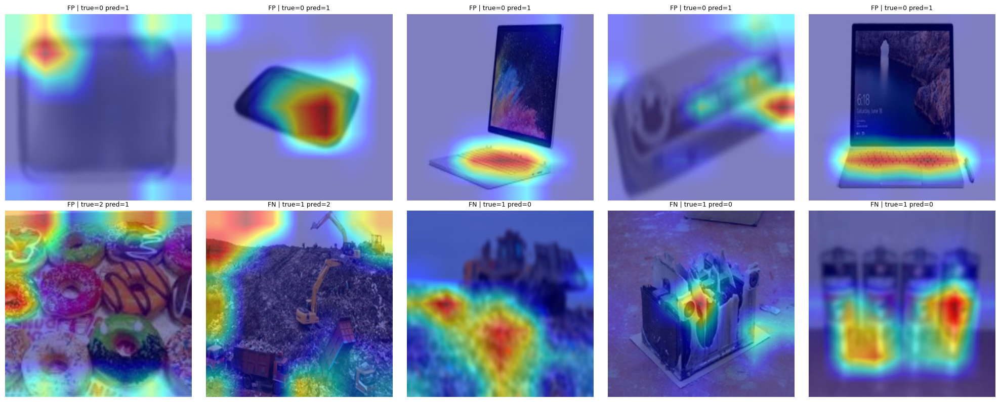

Saved to /kaggle/working/gradcam_electronic_errors.png


In [36]:
# Cell 30 — Grad-CAM Electronic failure mode: FP and FN cases
# False Positive: predicted=1, true != 1
fp_electronic_mask    = (val_preds_np == 1) & (val_labels_np != 1)
fp_electronic_indices = np.where(fp_electronic_mask)[0]

# False Negative: true=1, predicted != 1
fn_electronic_mask    = (val_labels_np == 1) & (val_preds_np != 1)
fn_electronic_indices = np.where(fn_electronic_mask)[0]

print(f"False Positive Electronic (predicted=1, true!=1): {len(fp_electronic_indices)} cases")
for idx in fp_electronic_indices:
    print(f"  idx={idx}, true={val_labels_np[idx]}, filepath={val_filepaths_all[idx]}")

print(f"\nFalse Negative Electronic (true=1, predicted!=1): {len(fn_electronic_indices)} cases")
for idx in fn_electronic_indices:
    print(f"  idx={idx}, pred={val_preds_np[idx]}, filepath={val_filepaths_all[idx]}")

recy_org_confusion_mask    = (
    ((val_labels_np == 0) & (val_preds_np == 2)) |
    ((val_labels_np == 2) & (val_preds_np == 0))
)
recy_org_confusion_indices = np.where(recy_org_confusion_mask)[0]
print(f"\nRecyclable <-> Organic confusion: {len(recy_org_confusion_indices)} cases")

# Visualize FP + FN with Grad-CAM
fp_fn_indices = list(fp_electronic_indices) + list(fn_electronic_indices)
fp_fn_labels  = ["FP"] * len(fp_electronic_indices) + ["FN"] * len(fn_electronic_indices)

fig, axes = plt.subplots(2, 5, figsize=(20, 8))
for i, (idx, err_type) in enumerate(zip(fp_fn_indices, fp_fn_labels)):
    row, col = divmod(i, 5)
    ax       = axes[row, col]

    filepath   = val_filepaths_all[idx]
    true_label = val_labels_np[idx]
    pred_label = val_preds_np[idx]

    img_np, tensor = load_and_preprocess(filepath)
    grayscale_cam  = cam(input_tensor=tensor, targets=[ClassifierOutputTarget(int(pred_label))])[0]
    cam_image      = show_cam_on_image(img_np, grayscale_cam, use_rgb=True)

    ax.imshow(cam_image)
    ax.set_title(f"{err_type} | true={true_label} pred={pred_label}", fontsize=9)
    ax.axis("off")

for i in range(len(fp_fn_indices), 10):
    row, col = divmod(i, 5)
    axes[row, col].axis("off")

plt.tight_layout()
plt.savefig(str(output_dir / "gradcam_electronic_errors.png"), dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved to {output_dir / 'gradcam_electronic_errors.png'}")

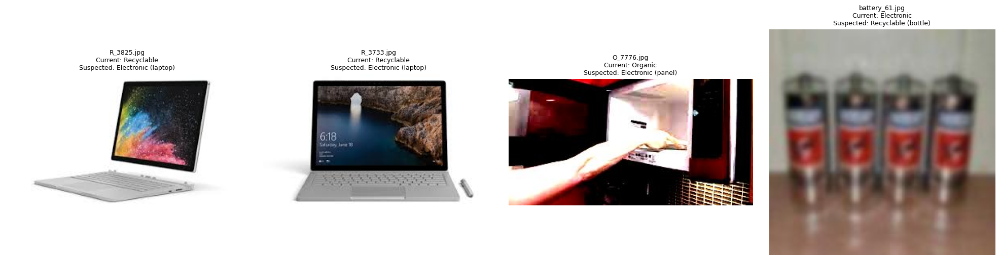

Saved to /kaggle/working/mislabel_verification_batch1.png

Searching for FN candidates (true=Electronic, predicted=Organic):
Total FN (Electronic->Organic) in val set: 1
                                                                  filename                                                                                                                                                            filepath
70.tpa-adalah-tempat-pemrosesan-akhir-bukan-tempat-pembuangan-akhir-39.jpg /kaggle/input/datasets/ababilkhoerulimam/bdc-satria-data-2026/BDC2026/train/1_Electronic/70.tpa-adalah-tempat-pemrosesan-akhir-bukan-tempat-pembuangan-akhir-39.jpg


In [37]:
# Cell 31 — Manual mislabel candidate verification
import math

mislabel_candidates = [
    {"filename": "R_3825.jpg",     "current_label": "Recyclable", "suspected": "Electronic (laptop)"},
    {"filename": "R_3733.jpg",     "current_label": "Recyclable", "suspected": "Electronic (laptop)"},
    {"filename": "O_7776.jpg",     "current_label": "Organic",    "suspected": "Electronic (panel)"},
    {"filename": "battery_61.jpg", "current_label": "Electronic", "suspected": "Recyclable (bottle)"},
]

fig, axes = plt.subplots(1, len(mislabel_candidates), figsize=(20, 5))
for ax, cand in zip(axes, mislabel_candidates):
    found_path = None
    for class_folder in class_folders:
        candidate_path = train_dir / class_folder / cand["filename"]
        if candidate_path.exists():
            found_path = str(candidate_path)
            break
    if found_path:
        img = load_image_as_rgb(found_path)
        ax.imshow(img)
        ax.set_title(
            f"{cand['filename']}\nCurrent: {cand['current_label']}\nSuspected: {cand['suspected']}",
            fontsize=9,
        )
    else:
        ax.text(0.5, 0.5, f"File not found:\n{cand['filename']}",
                ha="center", va="center", fontsize=10, color="red")
    ax.axis("off")

plt.tight_layout()
plt.savefig(output_dir / "mislabel_verification_batch1.png", dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved to {output_dir / 'mislabel_verification_batch1.png'}")

# Find FN Electronic -> Organic candidates for excavator filename lookup
print("\nSearching for FN candidates (true=Electronic, predicted=Organic):")
fn_electronic_as_organic = val_df[
    (val_df["label"] == 1) &
    (val_df.index.isin([
        i for i, (true, pred) in enumerate(zip(val_labels_all, val_preds_all))
        if true == 1 and pred == 2
    ]))
]
print(f"Total FN (Electronic->Organic) in val set: {len(fn_electronic_as_organic)}")
print(fn_electronic_as_organic[["filename", "filepath"]].to_string(index=False))

In [38]:
# Cell 32 — Non-standard filename pattern analysis
import re

def is_standard_pattern(filename):
    patterns = [
        r"^R_\d+\.(jpg|jpeg|png)$",
        r"^O_\d+\.(jpg|jpeg|png)$",
        r"^[A-Za-z]+_\d+(\(\d+\))?\.(jpg|jpeg|png)$",
        r"^(Copy of )?IMG_\d+.*\.(jpg|jpeg|png)$",
        r"^\d+\.(jpg|jpeg|png)$",
    ]
    return any(re.match(p, filename, re.IGNORECASE) for p in patterns)

def looks_like_caption(filename):
    word_count     = len(re.findall(r"[a-zA-Z]{3,}", filename))
    has_separator  = "-" in filename or " " in filename
    return word_count >= 4 and has_separator

suspicious = train_master[~train_master["filename"].apply(is_standard_pattern)].copy()
suspicious["looks_like_caption"] = suspicious["filename"].apply(looks_like_caption)

print(f"Total non-standard files (all classes): {len(suspicious)}")
print(f"Caption-like filenames                : {suspicious['looks_like_caption'].sum()}")
print(suspicious.groupby("label").size())

Total non-standard files (all classes): 1039
Caption-like filenames                : 333
label
1    1039
dtype: int64


In [40]:
# Cell 32b - check regex match rate per class, verify is_standard_pattern isn't biased
import re

# Sanity check 1: confirm label dtype and unique values 
print("train_master['label'] dtype:", train_master["label"].dtype)
print("train_master['label'] unique values:", train_master["label"].unique())
print()

# Sanity check 2: match rate per class BEFORE filtering
train_master["is_standard"] = train_master["filename"].apply(is_standard_pattern)

match_summary = train_master.groupby("label")["is_standard"].agg(
    total="count",
    standard_count="sum",
)
match_summary["non_standard_count"] = match_summary["total"] - match_summary["standard_count"]
match_summary["non_standard_pct"] = (match_summary["non_standard_count"] / match_summary["total"] * 100).round(2)

print("Match rate per class:")
print(match_summary)
print()

# Sanity check 3: sample a few filenames per class to eyeball actual naming patterns
print("Sample filenames per class (5 each):")
for lbl in sorted(train_master["label"].unique()):
    sample_names = train_master[train_master["label"] == lbl]["filename"].sample(
        min(5, len(train_master[train_master["label"] == lbl])), random_state=42
    ).tolist()
    print(f"  Label {lbl}: {sample_names}")
print()

# Sanity check 4: show a few NON-STANDARD filenames per class (if any exist outside label=1)
print("Non-standard filenames OUTSIDE label=1 (if any):")
non_standard_other = train_master[(~train_master["is_standard"]) & (train_master["label"] != 1)]
print(f"  Count: {len(non_standard_other)}")
if len(non_standard_other) > 0:
    print(non_standard_other[["filename", "label"]].head(10).to_string(index=False))
else:
    print("  NONE FOUND — this confirms the regex is failing specifically for label=1 filenames,")
    print("  OR label=0/2 filenames genuinely all match standard patterns (R_####.jpg / O_####.jpg).")

train_master['label'] dtype: int64
train_master['label'] unique values: [0 1 2]

Match rate per class:
       total  standard_count  non_standard_count  non_standard_pct
label                                                             
0       9999            9999                   0              0.00
1       3961            2922                1039             26.23
2      12567           12567                   0              0.00

Sample filenames per class (5 each):
  Label 0: ['R_8801.jpg', 'R_9786.jpg', 'R_3300.jpg', 'R_5874.jpg', 'R_8434.jpg']
  Label 1: ['902.jpeg', '17.sampah-elektronik-menghasilkan-uang-lho.jpg', 'Mouse_75.jpg', 'pcb_167.jpg', 'Printer_182.jpg']
  Label 2: ['O_6417.jpg', 'O_1108.jpg', 'O_785.jpg', 'O_3074.jpg', 'O_432.jpg']

Non-standard filenames OUTSIDE label=1 (if any):
  Count: 0
  NONE FOUND — this confirms the regex is failing specifically for label=1 filenames,
  OR label=0/2 filenames genuinely all match standard patterns (R_####.jpg / O_####.jpg).


Caption-like breakdown by label:
label
1    333
dtype: int64

Saved: /kaggle/working/caption_like_candidates.csv

Total samples for visual check: 10


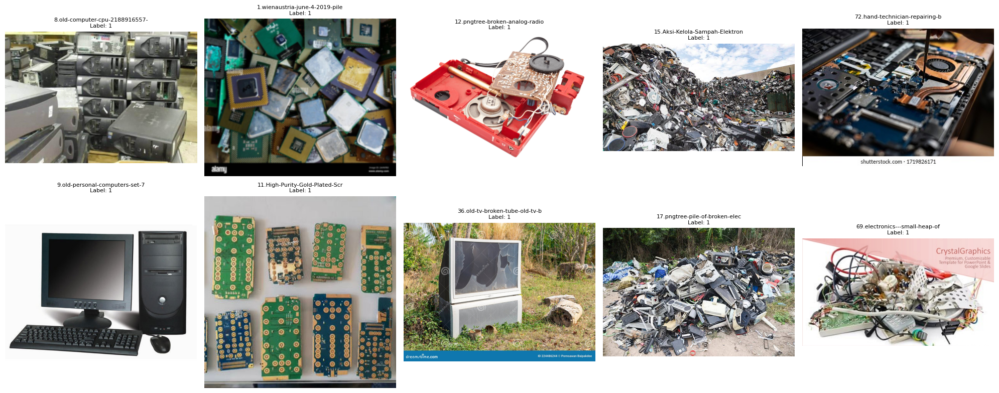

Saved: /kaggle/working/caption_visual_check_sample.png


In [41]:
# Cell 33 — Caption-like candidate visual inspection
caption_subset = suspicious[suspicious["looks_like_caption"]].copy()

print("Caption-like breakdown by label:")
print(caption_subset.groupby("label").size())

caption_subset[["filename", "label"]].to_csv(
    output_dir / "caption_like_candidates.csv", index=False
)
print(f"\nSaved: {output_dir / 'caption_like_candidates.csv'}")

# Stratified sample for visual check
N_PER_CLASS  = 10
sample_list  = []
for cls, group in caption_subset.groupby("label"):
    n = min(N_PER_CLASS, len(group))
    sample_list.append(group.sample(n=n, random_state=42))
visual_sample = pd.concat(sample_list).reset_index(drop=True)

print(f"\nTotal samples for visual check: {len(visual_sample)}")

# resolve actual filepath by searching class_folders
def resolve_filepath(filename):
    for class_folder in class_folders:
        candidate_path = train_dir / class_folder / filename
        if candidate_path.exists():
            return str(candidate_path)
    return None

n_cols = 5
n_rows = math.ceil(len(visual_sample) / n_cols)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 4 * n_rows))
axes = axes.flatten()

for idx, row in visual_sample.iterrows():
    filepath = resolve_filepath(row["filename"])
    if filepath:
        try:
            img = load_image_as_rgb(filepath)
            axes[idx].imshow(img)
            axes[idx].set_title(f"{row['filename'][:30]}\nLabel: {row['label']}", fontsize=8)
        except Exception as e:
            axes[idx].set_title(f"Load error:\n{row['filename'][:20]}", fontsize=8)
    else:
        axes[idx].set_title(f"NOT FOUND:\n{row['filename'][:20]}", fontsize=8, color="red")
    axes[idx].axis("off")

for idx in range(len(visual_sample), len(axes)):
    axes[idx].axis("off")

plt.tight_layout()
plt.savefig(output_dir / "caption_visual_check_sample.png", dpi=100)
plt.show()
print(f"Saved: {output_dir / 'caption_visual_check_sample.png'}")

In [42]:
# Cell 34 (Relabel 4 manually-verified mislabeled files)
import pandas as pd

RELABEL_MAP = {
    "R_3825.jpg":     1,  # was Recyclable(0) -> Electronic (confirmed: laptop)
    "R_3733.jpg":     1,  # was Recyclable(0) -> Electronic (confirmed: laptop)
    "O_7776.jpg":     1,  # was Organic(2)    -> Electronic (confirmed: control panel)
    "battery_61.jpg": 0,  # was Electronic(1) -> Recyclable (confirmed: bottles)
}

fold_df_path = output_dir / "train_master_with_folds.csv"
fold_df = pd.read_csv(fold_df_path)

print("BEFORE relabel:")
for fname in RELABEL_MAP:
    row = fold_df[fold_df["filename"] == fname]
    if len(row) > 0:
        print(f"  {fname}: label={row['label'].values[0]}")
    else:
        print(f"  {fname}: NOT FOUND in fold_df — check filename match")

# Apply relabel
relabel_count = 0
for fname, new_label in RELABEL_MAP.items():
    mask = fold_df["filename"] == fname
    if mask.sum() == 0:
        print(f"WARNING: {fname} not found, skipped")
        continue
    if mask.sum() > 1:
        print(f"WARNING: {fname} matched {mask.sum()} rows — check for duplicate filenames across classes")
    fold_df.loc[mask, "label"] = new_label
    relabel_count += mask.sum()

print(f"\nTotal rows relabeled: {relabel_count} / {len(RELABEL_MAP)} expected")

print("\nAFTER relabel:")
for fname in RELABEL_MAP:
    row = fold_df[fold_df["filename"] == fname]
    if len(row) > 0:
        print(f"  {fname}: label={row['label'].values[0]}")

# Save back — OVERWRITE with backup safeguard
backup_path = output_dir / "train_master_with_folds_PRE_RELABEL_BACKUP.csv"
if not backup_path.exists():
    pd.read_csv(fold_df_path).to_csv(backup_path, index=False)
    print(f"\nBackup saved: {backup_path}")
else:
    print(f"\nBackup already exists at {backup_path}, not overwritten")

fold_df.to_csv(fold_df_path, index=False)
print(f"Updated fold file saved: {fold_df_path}")

# Sanity check: class distribution after relabel
print("\nClass distribution AFTER relabel:")
print(fold_df[fold_df["fold"] != -1]["label"].value_counts(normalize=True).sort_index())

BEFORE relabel:
  R_3825.jpg: label=0
  R_3733.jpg: label=0
  O_7776.jpg: label=2
  battery_61.jpg: label=1

Total rows relabeled: 4 / 4 expected

AFTER relabel:
  R_3825.jpg: label=1
  R_3733.jpg: label=1
  O_7776.jpg: label=1
  battery_61.jpg: label=0

Backup saved: /kaggle/working/train_master_with_folds_PRE_RELABEL_BACKUP.csv
Updated fold file saved: /kaggle/working/train_master_with_folds.csv

Class distribution AFTER relabel:
label
0    0.378297
1    0.149873
2    0.471830
Name: proportion, dtype: float64


In [43]:
# Cell 35 (Class-Balanced Loss + Weighted Random Sampler, cleaned data after relabeling)
# Rebuild the DataLoader from the relabeled CSV (Cell 34), then train using Class-Balanced Loss

import torch
import torch.nn as nn
from torch.utils.data import DataLoader, WeightedRandomSampler
import numpy as np
import pandas as pd

# Rebuild the DataLoader from the cleaned dataset
BATCH_SIZE       = 64
NUM_WORKERS      = 4
FOLD_TO_VALIDATE = 0

fold_df = pd.read_csv(output_dir / "train_master_with_folds.csv")  # sudah bersih pasca Cell 34

train_df = fold_df[(fold_df["fold"] != FOLD_TO_VALIDATE) & (fold_df["fold"] != -1)].reset_index(drop=True)
val_df   = fold_df[fold_df["fold"] == FOLD_TO_VALIDATE].reset_index(drop=True)

print(f"Train size: {len(train_df)}, Val size: {len(val_df)}")
print(f"Train label distribution:\n{train_df['label'].value_counts(normalize=True).sort_index()}")

train_dataset = WasteDataset(train_df, transform=train_transform, is_test=False)
val_dataset   = WasteDataset(val_df,   transform=eval_transform,  is_test=False)

# Weighted Random Sampler 
# # (Electronic samples are drawn more frequently)
class_counts  = train_df["label"].value_counts().sort_index()
class_weights_sampler = 1.0 / class_counts
sample_weights = train_df["label"].map(class_weights_sampler).values

sampler = WeightedRandomSampler(
    weights=sample_weights,
    num_samples=len(sample_weights),
    replacement=True,
)

print(f"\nClass counts: {class_counts.to_dict()}")
print(f"Sampler weights per class: {class_weights_sampler.to_dict()}")

# Using a sampler replaces shuffle=True (they cannot be used together)
train_loader = DataLoader(
    train_dataset, batch_size=BATCH_SIZE, sampler=sampler,
    num_workers=NUM_WORKERS, pin_memory=True,
)
val_loader = DataLoader(
    val_dataset, batch_size=BATCH_SIZE, shuffle=False,
    num_workers=NUM_WORKERS, pin_memory=True,
)

print(f"\nTrain batches: {len(train_loader)}, Val batches: {len(val_loader)}")

# Class-Balanced Loss (effective number of samples)
BETA = 0.9999  # standard value, close to 1 for large datasets

effective_num = 1.0 - np.power(BETA, class_counts.values)
cb_weights    = (1.0 - BETA) / effective_num
cb_weights    = cb_weights / cb_weights.sum() * len(class_counts)  # normalize

cb_weights_tensor = torch.tensor(cb_weights, dtype=torch.float32).to(device)
print(f"\nClass-Balanced weights (beta={BETA}): {cb_weights_tensor.cpu().numpy()}")
print(f"  Recyclable={cb_weights_tensor[0]:.4f}, Electronic={cb_weights_tensor[1]:.4f}, Organic={cb_weights_tensor[2]:.4f}")

criterion = nn.CrossEntropyLoss(weight=cb_weights_tensor)

# Fresh model, optimizer, scheduler for exp002
model = timm.create_model(
    "convnextv2_tiny.fcmae_ft_in22k_in1k",
    pretrained=True,
    num_classes=3,
)
model = model.to(device)

BACKBONE_LR  = 1e-5
HEAD_LR      = 1e-4
WEIGHT_DECAY = 0.05

head_params     = list(model.head.parameters())
head_param_ids  = {id(p) for p in head_params}
backbone_params = [p for p in model.parameters() if id(p) not in head_param_ids]

optimizer = optim.AdamW([
    {"params": backbone_params, "lr": BACKBONE_LR},
    {"params": head_params,     "lr": HEAD_LR},
], weight_decay=WEIGHT_DECAY)

NUM_EPOCHS         = 15
WARMUP_STEPS_RATIO = 0.075

total_steps  = len(train_loader) * NUM_EPOCHS
warmup_steps = int(total_steps * WARMUP_STEPS_RATIO)

def lr_lambda(current_step):
    if current_step < warmup_steps:
        return float(current_step) / float(max(1, warmup_steps))
    progress = float(current_step - warmup_steps) / float(max(1, total_steps - warmup_steps))
    return 0.5 * (1.0 + torch.cos(torch.tensor(progress * 3.14159265)).item())

scheduler = optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=lr_lambda)
scaler    = GradScaler("cuda")

print(f"\nFresh model + optimizer + scheduler ready for exp002 (Class-Balanced Loss + Weighted Sampler).")
print(f"Total steps: {total_steps}, Warmup steps: {warmup_steps}")

Train size: 21143, Val size: 5286
Train label distribution:
label
0    0.378329
1    0.149742
2    0.471929
Name: proportion, dtype: float64

Class counts: {0: 7999, 1: 3166, 2: 9978}
Sampler weights per class: {0: 0.00012501562695336918, 1: 0.0003158559696778269, 2: 0.00010022048506714773}

Train batches: 331, Val batches: 83

Class-Balanced weights (beta=0.9999): [0.768998  1.5602828 0.6707191]
  Recyclable=0.7690, Electronic=1.5603, Organic=0.6707

Fresh model + optimizer + scheduler ready for exp002 (Class-Balanced Loss + Weighted Sampler).
Total steps: 4965, Warmup steps: 372


In [44]:
# Cell 36 (Training loop — exp002: Class-Balanced Los
from sklearn.metrics import f1_score
import numpy as np
import time

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model  = model.to(device)

start_epoch = 0
best_val_f1 = 0.0
best_epoch  = -1
history     = []

print("exp002: Fresh training (Class-Balanced Loss + Weighted Sampler))")

for epoch in range(start_epoch, NUM_EPOCHS):
    epoch_start = time.time()

    # Train
    model.train()
    train_loss_sum = 0.0
    train_correct  = 0
    train_total    = 0

    for images, labels in train_loader:
        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)

        with autocast("cuda"):
            outputs = model(images)
            loss    = criterion(outputs, labels)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        scheduler.step()

        train_loss_sum += loss.item() * images.size(0)
        preds           = outputs.argmax(dim=1)
        train_correct  += (preds == labels).sum().item()
        train_total    += images.size(0)

    train_loss = train_loss_sum / train_total
    train_acc  = train_correct / train_total

    # Validate
    model.eval()
    val_loss_sum   = 0.0
    val_preds_all  = []
    val_labels_all = []

    with torch.no_grad():
        for images, labels in val_loader:
            images = images.to(device, non_blocking=True)
            labels = labels.to(device, non_blocking=True)

            with autocast("cuda"):
                outputs = model(images)
                loss    = criterion(outputs, labels)

            val_loss_sum += loss.item() * images.size(0)
            preds         = outputs.argmax(dim=1)
            val_preds_all.extend(preds.cpu().numpy().tolist())
            val_labels_all.extend(labels.cpu().numpy().tolist())

    val_loss         = val_loss_sum / len(val_labels_all)
    val_macro_f1     = f1_score(val_labels_all, val_preds_all, average="macro")
    val_f1_per_class = f1_score(val_labels_all, val_preds_all, average=None)
    epoch_time       = time.time() - epoch_start

    current_lr_backbone = optimizer.param_groups[0]["lr"]
    current_lr_head     = optimizer.param_groups[1]["lr"]

    print(
        f"Epoch {epoch+1}/{NUM_EPOCHS} | "
        f"train_loss={train_loss:.4f} train_acc={train_acc:.4f} | "
        f"val_loss={val_loss:.4f} val_macro_f1={val_macro_f1:.4f} | "
        f"F1[Recy={val_f1_per_class[0]:.3f}, Elec={val_f1_per_class[1]:.3f}, Org={val_f1_per_class[2]:.3f}] | "
        f"LR[bb={current_lr_backbone:.2e}, head={current_lr_head:.2e}] | "
        f"time={epoch_time:.1f}s"
    )

    history.append({
        "epoch":             epoch + 1,
        "train_loss":        train_loss,
        "train_acc":         train_acc,
        "val_loss":          val_loss,
        "val_macro_f1":      val_macro_f1,
        "val_f1_recyclable": val_f1_per_class[0],
        "val_f1_electronic": val_f1_per_class[1],
        "val_f1_organic":    val_f1_per_class[2],
    })

    if val_macro_f1 > best_val_f1:
        best_val_f1     = val_macro_f1
        best_epoch      = epoch + 1
        checkpoint_path = os.path.join(output_dir, f"model_exp002_cbloss_cv{best_val_f1:.4f}.pt")
        torch.save({
            "epoch":                epoch + 1,
            "model_state_dict":     model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "val_macro_f1":         val_macro_f1,
            "val_f1_per_class":     val_f1_per_class.tolist(),
        }, checkpoint_path)
        print(f"  -> New best checkpoint saved: {checkpoint_path}")

print(f"\nTraining complete. Best val_macro_f1={best_val_f1:.4f} at epoch {best_epoch}")

history_df  = pd.DataFrame(history)
print(history_df.to_string(index=False, float_format=lambda x: f"{x:.4f}"))

history_csv = os.path.join(output_dir, "training_history_exp002_cbloss.csv")
history_df.to_csv(history_csv, index=False)
print(f"\nHistory saved to {history_csv}")

exp002: Fresh training (Class-Balanced Loss + Weighted Sampler), tidak resume dari checkpoint manapun.


/tmp/ipykernel_58/1929526047.py:39: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  scheduler.step()


Epoch 1/15 | train_loss=0.6137 train_acc=0.6923 | val_loss=0.2319 val_macro_f1=0.9390 | F1[Recy=0.924, Elec=0.952, Org=0.941] | LR[bb=8.90e-06, head=8.90e-05] | time=223.5s
  -> New best checkpoint saved: /kaggle/working/model_exp002_cbloss_cv0.9390.pt
Epoch 2/15 | train_loss=0.0993 train_acc=0.9622 | val_loss=0.1136 val_macro_f1=0.9669 | F1[Recy=0.953, Elec=0.983, Org=0.965] | LR[bb=9.90e-06, head=9.90e-05] | time=222.2s
  -> New best checkpoint saved: /kaggle/working/model_exp002_cbloss_cv0.9669.pt
Epoch 3/15 | train_loss=0.0574 train_acc=0.9746 | val_loss=0.1019 val_macro_f1=0.9697 | F1[Recy=0.957, Elec=0.986, Org=0.966] | LR[bb=9.56e-06, head=9.56e-05] | time=221.4s
  -> New best checkpoint saved: /kaggle/working/model_exp002_cbloss_cv0.9697.pt
Epoch 4/15 | train_loss=0.0433 train_acc=0.9808 | val_loss=0.0761 val_macro_f1=0.9760 | F1[Recy=0.965, Elec=0.991, Org=0.972] | LR[bb=8.98e-06, head=8.98e-05] | time=223.3s
  -> New best checkpoint saved: /kaggle/working/model_exp002_cbloss_

In [47]:
# Cell 36b (exp003 — TRUE clean baseline: plain CE + data bersih, tanpa CB-Loss/Sampler)
# Ini pembanding valid untuk exp002 (CB-Loss+Sampler) — satu-satunya variabel yang beda
# dari exp002 adalah loss function & sampler, semua lain (data, arsitektur, LR, epoch) identik.

import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import pandas as pd
import time
from sklearn.metrics import f1_score

# ---------- Step 1: Rebuild loader dari data bersih, TANPA sampler ----------
BATCH_SIZE       = 64
NUM_WORKERS      = 4
FOLD_TO_VALIDATE = 0

fold_df = pd.read_csv(output_dir / "train_master_with_folds.csv")  # sudah bersih pasca Cell 34

train_df = fold_df[(fold_df["fold"] != FOLD_TO_VALIDATE) & (fold_df["fold"] != -1)].reset_index(drop=True)
val_df   = fold_df[fold_df["fold"] == FOLD_TO_VALIDATE].reset_index(drop=True)

print(f"Train size: {len(train_df)}, Val size: {len(val_df)}")
print(f"Train label distribution:\n{train_df['label'].value_counts(normalize=True).sort_index()}")

train_dataset = WasteDataset(train_df, transform=train_transform, is_test=False)
val_dataset   = WasteDataset(val_df,   transform=eval_transform,  is_test=False)

# PLAIN shuffle, TIDAK pakai WeightedRandomSampler — ini bedanya dari exp002
train_loader = DataLoader(
    train_dataset, batch_size=BATCH_SIZE, shuffle=True,
    num_workers=NUM_WORKERS, pin_memory=True,
)
val_loader = DataLoader(
    val_dataset, batch_size=BATCH_SIZE, shuffle=False,
    num_workers=NUM_WORKERS, pin_memory=True,
)

print(f"\nTrain batches: {len(train_loader)}, Val batches: {len(val_loader)}")

# ---------- Step 2: Plain CrossEntropyLoss, TIDAK pakai class weight ----------
criterion = nn.CrossEntropyLoss()  # PLAIN — ini bedanya dari exp002
print("\nLoss: plain CrossEntropyLoss (no class weight) — ini clean baseline pembanding exp002")

# ---------- Step 3: Fresh model, optimizer, scheduler ----------
model = timm.create_model(
    "convnextv2_tiny.fcmae_ft_in22k_in1k",
    pretrained=True,
    num_classes=3,
)
model = model.to(device)

BACKBONE_LR  = 1e-5
HEAD_LR      = 1e-4
WEIGHT_DECAY = 0.05

head_params     = list(model.head.parameters())
head_param_ids  = {id(p) for p in head_params}
backbone_params = [p for p in model.parameters() if id(p) not in head_param_ids]

optimizer = optim.AdamW([
    {"params": backbone_params, "lr": BACKBONE_LR},
    {"params": head_params,     "lr": HEAD_LR},
], weight_decay=WEIGHT_DECAY)

NUM_EPOCHS         = 15
WARMUP_STEPS_RATIO = 0.075

total_steps  = len(train_loader) * NUM_EPOCHS
warmup_steps = int(total_steps * WARMUP_STEPS_RATIO)

def lr_lambda(current_step):
    if current_step < warmup_steps:
        return float(current_step) / float(max(1, warmup_steps))
    progress = float(current_step - warmup_steps) / float(max(1, total_steps - warmup_steps))
    return 0.5 * (1.0 + torch.cos(torch.tensor(progress * 3.14159265)).item())

scheduler = optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=lr_lambda)
scaler    = GradScaler("cuda")

print(f"Fresh model + optimizer + scheduler ready for exp003 (clean baseline).")
print(f"Total steps: {total_steps}, Warmup steps: {warmup_steps}")

# ---------- Step 4: Training loop ----------
best_val_f1 = 0.0
best_epoch  = -1
history     = []

for epoch in range(NUM_EPOCHS):
    epoch_start = time.time()

    model.train()
    train_loss_sum, train_correct, train_total = 0.0, 0, 0

    for images, labels in train_loader:
        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)
        with autocast("cuda"):
            outputs = model(images)
            loss    = criterion(outputs, labels)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        scheduler.step()

        train_loss_sum += loss.item() * images.size(0)
        preds = outputs.argmax(dim=1)
        train_correct += (preds == labels).sum().item()
        train_total += images.size(0)

    train_loss = train_loss_sum / train_total
    train_acc  = train_correct / train_total

    model.eval()
    val_loss_sum, val_preds_all, val_labels_all = 0.0, [], []

    with torch.no_grad():
        for images, labels in val_loader:
            images = images.to(device, non_blocking=True)
            labels = labels.to(device, non_blocking=True)
            with autocast("cuda"):
                outputs = model(images)
                loss    = criterion(outputs, labels)
            val_loss_sum += loss.item() * images.size(0)
            preds = outputs.argmax(dim=1)
            val_preds_all.extend(preds.cpu().numpy().tolist())
            val_labels_all.extend(labels.cpu().numpy().tolist())

    val_loss         = val_loss_sum / len(val_labels_all)
    val_macro_f1     = f1_score(val_labels_all, val_preds_all, average="macro")
    val_f1_per_class = f1_score(val_labels_all, val_preds_all, average=None)
    epoch_time       = time.time() - epoch_start

    print(
        f"Epoch {epoch+1}/{NUM_EPOCHS} | "
        f"train_loss={train_loss:.4f} train_acc={train_acc:.4f} | "
        f"val_loss={val_loss:.4f} val_macro_f1={val_macro_f1:.4f} | "
        f"F1[Recy={val_f1_per_class[0]:.3f}, Elec={val_f1_per_class[1]:.3f}, Org={val_f1_per_class[2]:.3f}] | "
        f"time={epoch_time:.1f}s"
    )

    history.append({
        "epoch": epoch + 1, "train_loss": train_loss, "train_acc": train_acc,
        "val_loss": val_loss, "val_macro_f1": val_macro_f1,
        "val_f1_recyclable": val_f1_per_class[0],
        "val_f1_electronic": val_f1_per_class[1],
        "val_f1_organic": val_f1_per_class[2],
    })

    if val_macro_f1 > best_val_f1:
        best_val_f1 = val_macro_f1
        best_epoch  = epoch + 1
        checkpoint_path = os.path.join(output_dir, f"model_exp003_cleanbaseline_cv{best_val_f1:.4f}.pt")
        torch.save({
            "epoch": epoch + 1, "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "val_macro_f1": val_macro_f1, "val_f1_per_class": val_f1_per_class.tolist(),
        }, checkpoint_path)
        print(f"  -> New best checkpoint saved: {checkpoint_path}")

print(f"\nTraining complete. Best val_macro_f1={best_val_f1:.4f} at epoch {best_epoch}")

history_df = pd.DataFrame(history)
print(history_df.to_string(index=False, float_format=lambda x: f"{x:.4f}"))
history_df.to_csv(output_dir / "training_history_exp003_cleanbaseline.csv", index=False)
print(f"\nHistory saved.")

Train size: 21143, Val size: 5286
Train label distribution:
label
0    0.378329
1    0.149742
2    0.471929
Name: proportion, dtype: float64

Train batches: 331, Val batches: 83

Loss: plain CrossEntropyLoss (no class weight) — ini clean baseline pembanding exp002
Fresh model + optimizer + scheduler ready for exp003 (clean baseline).
Total steps: 4965, Warmup steps: 372


/tmp/ipykernel_58/3854717546.py:106: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  scheduler.step()


Epoch 1/15 | train_loss=0.6647 train_acc=0.7105 | val_loss=0.1807 val_macro_f1=0.9501 | F1[Recy=0.932, Elec=0.965, Org=0.953] | time=221.7s
  -> New best checkpoint saved: /kaggle/working/model_exp003_cleanbaseline_cv0.9501.pt
Epoch 2/15 | train_loss=0.1355 train_acc=0.9550 | val_loss=0.0995 val_macro_f1=0.9696 | F1[Recy=0.959, Elec=0.981, Org=0.969] | time=222.0s
  -> New best checkpoint saved: /kaggle/working/model_exp003_cleanbaseline_cv0.9696.pt
Epoch 3/15 | train_loss=0.0824 train_acc=0.9729 | val_loss=0.0819 val_macro_f1=0.9756 | F1[Recy=0.965, Elec=0.991, Org=0.971] | time=221.2s
  -> New best checkpoint saved: /kaggle/working/model_exp003_cleanbaseline_cv0.9756.pt
Epoch 4/15 | train_loss=0.0603 train_acc=0.9809 | val_loss=0.0750 val_macro_f1=0.9771 | F1[Recy=0.968, Elec=0.988, Org=0.975] | time=221.7s
  -> New best checkpoint saved: /kaggle/working/model_exp003_cleanbaseline_cv0.9771.pt
Epoch 5/15 | train_loss=0.0405 train_acc=0.9871 | val_loss=0.0695 val_macro_f1=0.9799 | F1[R